In [2]:
import numpy as np
import matplotlib as plt 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('winequality-red.csv')

In [4]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [6]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [7]:
df.info() 

#tipos de datos 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [9]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [14]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [8]:
#renombramos las columnas

df.rename(columns={'fixed acidity':'fixed_acidity',
                        'volatile acidity':'volatile_acidity'},
               inplace=True)



In [9]:
df.rename(columns={'citric acid':'citric_acid',
                        'residual sugar':'residual_sugar','free sulfur dioxide': 
                   'free_sulfur_dioxide','total sulfur dioxide': 'total_sulfur_dioxide' },
               inplace=True)

In [16]:
new_df=( df.groupby(['fixed_acidity','volatile_acidity','quality'],as_index=False)
           .agg(list)
           .reindex(columns=df.columns) )
print(new_df)

      fixed_acidity  volatile_acidity   citric_acid residual_sugar  \
0               4.6             0.520        [0.15]          [2.1]   
1               4.7             0.600        [0.17]          [2.3]   
2               4.9             0.420         [0.0]          [2.1]   
3               5.0             0.380        [0.01]          [1.6]   
4               5.0             0.400         [0.5]          [4.3]   
...             ...               ...           ...            ...   
1233           15.0             0.210  [0.44, 0.44]     [2.2, 2.2]   
1234           15.5             0.645  [0.49, 0.49]     [4.2, 4.2]   
1235           15.6             0.645        [0.49]          [4.2]   
1236           15.6             0.685        [0.76]          [3.7]   
1237           15.9             0.360        [0.65]          [7.5]   

                   chlorides free_sulfur_dioxide total_sulfur_dioxide  \
0     [0.054000000000000006]               [8.0]               [65.0]   
1            

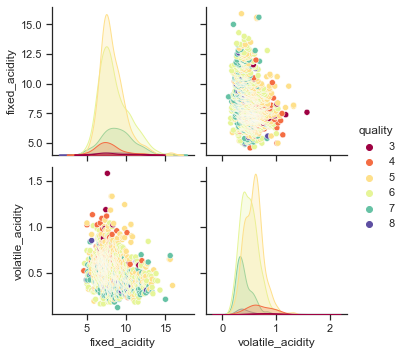

In [40]:
sns.set(style='ticks',color_codes=True)
g=sns.pairplot(new_df,hue='quality',palette='Spectral')

In [41]:
pip install pandas-profiling


  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27091 sha256=ae6c878453cea31199229a260b39fc8701ce433ca6b3518e97f8aa0687a6133d
  Stored in directory: c:\users\pc\appdata\local\pip\cache\wheels\23\14\6e\4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295204 sha256=3eb8f613587395ccb423be5a74f7bb9f65f19e1feb16d0e8768dfb005e1a549d
  Stored in directory: c:\users\pc\appdata\local\pip\cache\wheels\48\a1\7f\096c1269d6bf78d4768180602579b35a1e8cb1250bb4b40c74
Successfully built htmlmin imagehash


In [5]:
from pandas_profiling import ProfileReport
prof=ProfileReport(df)

In [1]:
import os
os.getcwd()

'C:\\Users\\PC'

In [6]:
prof